Idea of the project propose something:
for example my own architecture
loos score
or augmentation of the data

reference

use out of the box as a baseline

methodology separetes experiments section and do two experiments and show improvments on both.

Find paper where LSTMS still outperformers transformers in a time series. It will add more value to your stanging why not to use transoformers. Add some reasons in the paper also.

###Idea

- correlation between stocks

-for baseline predict closing price by last 10 days,

my idea to enhance by previous month closing and volume predict current closing value

#Q:

- Transformers?

**Correlation**:
Therefore use only one closings instead of open,closings,high?

## Data processing

In [215]:
!pip install -q yfinance
from pandas_datareader.data import DataReader
import yfinance as yf
from datetime import datetime
from pandas_datareader import data as pdr
from tqdm.notebook import tqdm
from keras.models import load_model


In [216]:
import pandas as pd
import numpy as np

In [217]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/uni2/AI/Project/stock prices.csv")

In [218]:
df.describe()

,open,high,low,close,volume
count,497461.000000,497464.000000,497464.000000,497472.000000,4.974720e+05
mean,86.352275,87.132562,85.552467,86.369082,4.253611e+06
std,101.471228,102.312062,100.570957,101.472407,8.232139e+06
min,1.620000,1.690000,1.500000,1.590000,0.000000e+00
25%,41.690000,42.090000,41.280000,41.703750,1.080166e+06
50%,64.970000,65.560000,64.353700,64.980000,2.084896e+06
75%,98.410000,99.230000,97.580000,98.420000,4.271928e+06
max,2044.000000,2067.990000,2035.110000,2049.000000,6.182376e+08


In [219]:
symbols = df.symbol.unique()

In [220]:
def get_one_stock(name):
  tmp = df[df.symbol == name]
  tmp.set_index(tmp.columns[1], inplace=True)
  return tmp

In [221]:
get_one_stock("AAL")

,symbol,open,high,low,close,volume
date,,,,,,
2014-01-02,AAL,25.07,25.8200,25.06,25.360,8998943
2014-01-03,AAL,25.75,26.7500,25.51,26.540,13836062
2014-01-06,AAL,26.62,27.2000,26.60,27.030,11272273
2014-01-07,AAL,27.20,27.3997,26.67,26.905,11288775
2014-01-08,AAL,26.37,27.6800,26.35,27.630,15736891
...,...,...,...,...,...,...
2017-12-22,AAL,52.72,52.8800,52.42,52.590,2425104
2017-12-26,AAL,52.35,53.2150,52.33,52.850,2774316
2017-12-27,AAL,52.80,52.8800,52.06,52.400,2831434


##Correlation matrix of symbols based on closings

Can be good for finding cause reresentation

In [ ]:
#for closing prices

In [ ]:
df.corr()

<ipython-input-82-2f6f6606aa2c>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,open,high,low,close,volume
open,1.000000,0.999941,0.999928,0.999876,-0.148724
high,0.999941,1.000000,0.999905,0.999938,-0.148344
low,0.999928,0.999905,1.000000,0.999941,-0.149284
close,0.999876,0.999938,0.999941,1.000000,-0.148839
volume,-0.148724,-0.148344,-0.149284,-0.148839,1.000000


In [ ]:
get_one_stock("AAPL").corr()

<ipython-input-84-1cf4c5e5b184>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,open,high,low,close,volume
open,1.000000,0.999325,0.999177,0.998561,-0.476345
high,0.999325,1.000000,0.998969,0.999326,-0.467871
low,0.999177,0.998969,1.000000,0.999370,-0.489558
close,0.998561,0.999326,0.999370,1.000000,-0.480332
volume,-0.476345,-0.467871,-0.489558,-0.480332,1.000000


In [ ]:
df.isna().sum()

symbol     0
date       0
open      11
high       8
low        8
close      0
volume     0
dtype: int64

Therefore use only one metric?

In [ ]:
closings = pd.DataFrame()

In [ ]:
len_total_for_one = len(get_one_stock("AAPL"))

cnt_of_not_full_information_of_closed = 0
for i in (df["symbol"].unique()):
  tmp = (list(get_one_stock(i).close))


  if len(tmp) < len_total_for_one:
    cnt_of_not_full_information_of_closed +=1
    continue
  # while len(tmp) < len_total_for_one:
  #   tmp.append(0)


  closings[i] = tmp


In [ ]:
print(cnt_of_not_full_information_of_closed)# number of skipped stocks due to not fully presented

26


In [ ]:
len(df["symbol"].unique())

505

In [ ]:
get_one_stock("AAPL").corr

,AAL,AAPL,AAP,ABBV,ABC,ABT,ACN,ADBE,ADI,ADM,...,XLNX,XL,XOM,XRAY,XRX,XYL,YUM,ZBH,ZION,ZTS
AAL,1.000000,0.688887,-0.113342,0.504646,0.453967,0.614749,0.344383,0.442083,0.564859,0.209041,...,0.396008,0.659368,-0.331995,0.248984,-0.165396,0.349352,-0.188790,0.303252,0.495809,0.535385
AAPL,0.688887,1.000000,-0.301453,0.836482,0.389703,0.836732,0.762628,0.853321,0.888135,0.041794,...,0.697084,0.828922,-0.585606,0.589021,-0.577186,0.725726,0.004419,0.558667,0.755558,0.908456
AAP,-0.113342,-0.301453,1.000000,-0.428910,0.457974,-0.355347,-0.223867,-0.449545,-0.341710,0.168697,...,-0.560247,-0.075597,-0.170779,0.066704,0.184776,-0.532251,0.053805,-0.050544,-0.468774,-0.225065
ABBV,0.504646,0.836482,-0.428910,1.000000,0.200958,0.859625,0.761206,0.821224,0.784272,0.013017,...,0.693082,0.549012,-0.405936,0.556290,-0.488908,0.784460,0.204539,0.523716,0.691086,0.855267
ABC,0.453967,0.389703,0.457974,0.200958,1.000000,0.481476,0.077479,0.001488,0.131350,0.217779,...,-0.215496,0.474182,-0.557113,0.201062,0.050566,-0.212145,0.316418,0.264621,-0.107964,0.307060
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XYL,0.349352,0.725726,-0.532251,0.784460,-0.212145,0.516543,0.883637,0.935750,0.870014,-0.218837,...,0.910135,0.504669,-0.287907,0.656578,-0.736199,1.000000,-0.047865,0.551305,0.844309,0.835057
YUM,-0.188790,0.004419,0.053805,0.204539,0.316418,0.279203,0.010094,-0.073124,-0.095378,0.130784,...,-0.185359,-0.147333,0.013453,-0.003508,0.193308,-0.047865,1.000000,0.319060,-0.268758,0.057642
ZBH,0.303252,0.558667,-0.050544,0.523716,0.264621,0.431299,0.562782,0.542351,0.555905,0.121472,...,0.393818,0.440339,-0.218377,0.586270,-0.358737,0.551305,0.319060,1.000000,0.361000,0.663081
ZION,0.495809,0.755558,-0.468774,0.691086,-0.107964,0.551114,0.730100,0.836228,0.901349,-0.013751,...,0.890412,0.623670,-0.290543,0.455386,-0.716690,0.844309,-0.268758,0.361000,1.000000,0.743268


In [ ]:
import plotly.express as px

fig = px.imshow(closings.corr(), text_auto=True)
fig.show()

In [ ]:
import plotly.express as px

fig = px.imshow(closings.corr(),
                text_auto=True)
                # labels=dict(x="Sy", y="Feature", color="Correlation"))

fig.update_layout(title="Correlation Matrix",
                  coloraxis_colorbar=dict(title="Correlation Coefficient"),
                  # width=8000,
                  # height=2000,
                  margin=dict(l=10, r=10, t=30, b=10)  # Reduced margins
                 )

fig.show()

# Random Forests

In [ ]:

alpha = [100,200,500,1000,2000]
max_depth = [5, 10]
# X_train, X_test, y_train, y_test = train_test_split(get_one_stock("AAPL")[0], get_one_stock("AAPL")[1], test_size=0.33)
X_train = dataset_train.iloc[:,2:]
y_train = dataset_train.iloc[:,0]

X_test = dataset_test.iloc[:,2:]
y_test = dataset_test.iloc[:,0]
i__=[]
j__=[]
all_rmse=[]
for i in alpha:
    for j in max_depth:
        print("for n_estimators =", i,"and max depth = ", j)
        clf = RandomForestRegressor(n_estimators=i, max_depth=j, random_state=42, n_jobs=-1)
        clf.fit(X_train, y_train.values.ravel())
        y_pred = clf.predict(X_test)
        rmse = np.sqrt(MSE(y_test, y_pred))
        print("rmse=",rmse,"Alpha=", i,"Max_depth=", j)
        all_rmse.append(rmse)
        i__.append(i)
        j__.append(j)

for n_estimators = 100 and max depth =  5


KeyboardInterrupt: ignored

#LSTM baseline (old)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM

In [ ]:
yf.pdr_override()
y_symbols = ['GOOG']
from datetime import datetime
startdate = datetime(2012,1,1)
enddate = datetime(2023,1,31)
df = pdr.get_data_yahoo(y_symbols, start=startdate, end=enddate)


[*********************100%%**********************]  1 of 1 completed


In [ ]:
yf.pdr_override()
y_symbols = ['AAPL']
from datetime import datetime
startdate = datetime(2014,1,1)
enddate = datetime(2017,1,31)
df1 = pdr.get_data_yahoo(y_symbols, start=startdate, end=enddate)


[*********************100%%**********************]  1 of 1 completed


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/uni2/AI/Project/stock prices.csv")

In [ ]:
df

,symbol,date,open,high,low,close,volume
0,AAL,2014-01-02,25.0700,25.8200,25.0600,25.3600,8998943
1,AAPL,2014-01-02,79.3828,79.5756,78.8601,79.0185,58791957
2,AAP,2014-01-02,110.3600,111.8800,109.2900,109.7400,542711
3,ABBV,2014-01-02,52.1200,52.3300,51.5200,51.9800,4569061
4,ABC,2014-01-02,70.1100,70.2300,69.4800,69.8900,1148391
...,...,...,...,...,...,...,...
497467,XYL,2017-12-29,68.5300,68.8000,67.9200,68.2000,1046677
497468,YUM,2017-12-29,82.6400,82.7100,81.5900,81.6100,1347613
497469,ZBH,2017-12-29,121.7500,121.9500,120.6200,120.6700,1023624
497470,ZION,2017-12-29,51.2800,51.5500,50.8100,50.8300,1261916


In [ ]:
data_tmp = get_one_stock("AAL")
# data_tmp.set_index(df.columns[1], inplace=True)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))

def get_dataset(df,name,n_days=60):
  name_stock=df.groupby('symbol').get_group(name)
  name_stock.set_index(df.columns[1], inplace=True)
  name_stock = name_stock.filter(['close']).values
  name_stock = scaler.fit_transform(name_stock)

  # dataset_train = pd.DataFrame()
  # dataset_test = pd.DataFrame()

  x_train = []
  y_train = []

  for i in range(n_days, len(name_stock)):
    x_train.append(name_stock[i-60:i])
    y_train.append(name_stock[i])
    # if i<= 61:
        # print(x_train)
        # print(y_train)
        # print()

  x_train, y_train = np.array(x_train), np.array(y_train)

  return x_train, y_train
  # # Convert the x_train and y_train to numpy arrays
  # x_train, y_train = np.array(x_train), np.array(y_train)

  # # Reshape the data
  # x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
  # # x_train.shape

  # for i in range(n_days, len(name_stock)):

  #     temp_data = pd.DataFrame()
  #     for j in range(n_days+1):
  #         if i - j >= 0:
  #             temp_data[f'prev_close_{j}_days_ago'] = [name_stock.loc[i - j, 'close']]
  #             temp_data[f'prev_vol_{j}_days_ago'] = [name_stock.loc[i - j, 'volume']]
  #         else:
  #             continue
  #     if name_stock.loc[i,"date"] < "2017-12-01":
  #       dataset_train = pd.concat([dataset_train,temp_data], ignore_index=True)
  #     else:
  #       dataset_test = pd.concat([dataset_test,temp_data], ignore_index=True)

  # return dataset_train,dataset_test


In [ ]:
x_train = None
y_train = None

for i in df.symbol.unique():
  x_tmp, y_tmp = get_dataset(df,i)

  if x_train is None:
      x_train = x_tmp
      y_train = y_tmp
  else:
      # Adjust axis according to the shape of your arrays
      x_train = np.concatenate([x_train, x_tmp], axis=0)
      y_train = np.concatenate([y_train, y_tmp], axis=0)
  # break


KeyboardInterrupt: ignored

In [ ]:
y_train

array([[0.37159724],
       [0.41554608],
       [0.40800262],
       ...,
       [0.8755983 ],
       [0.87832319],
       [0.86459393]])

In [ ]:
x_train.shape,y_train.shape

((947, 60, 1), (947, 1))

In [ ]:
x_train,y_train = get_dataset(df,"AAL")

In [ ]:
data = get_one_stock("AAPL").close

In [ ]:
data = df.Close

In [ ]:
scaler = MinMaxScaler(feature_range=(0,1))
training_data_len1 = -60
train_data1 = data.values[0:int(training_data_len1)].reshape(-1,1)
train_data1 = scaler.fit_transform(train_data1) #scale or not
print(train_data1)
# Split the data into x_train and y_train data sets
x_train = []
y_train = []

for i in range(60, len(train_data1)):
    x_train.append(train_data1[i-60:i, 0])
    y_train.append(train_data1[i, 0])
    if i<= 61:
        print(x_train)
        print(y_train)
        print()
# for i in range(60, len(train_data1)):
#     x_train.append(train_data[i-60:i, 0])
#     y_train.append(train_data[i, 0])
#     if i<= 61:
#         print(x_train)
#         print(y_train)
#         print()

# Convert the x_train and y_train to numpy arrays
x_train, y_train = np.array(x_train), np.array(y_train)

# Reshape the data
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
# x_train.shape

[[0.0822579 ]
 [0.06352442]
 [0.06807285]
 [0.06207509]
 [0.06734822]
 [0.05664772]
 [0.05112788]
 [0.05542969]
 [0.07186585]
 [0.08877994]
 [0.08398481]
 [0.06304641]
 [0.07599803]
 [0.07976016]
 [0.08696055]
 [0.07137245]
 [0.07820279]
 [0.01036133]
 [0.00149561]
 [0.        ]
 [0.00126431]
 [0.00269824]
 [0.01389207]
 [0.01975116]
 [0.01962781]
 [0.03068289]
 [0.04503756]
 [0.05578434]
 [0.05572259]
 [0.06884383]
 [0.06816532]
 [0.0712491 ]
 [0.0579583 ]
 [0.04836796]
 [0.03927102]
 [0.04281724]
 [0.03435254]
 [0.02709039]
 [0.04300235]
 [0.04079751]
 [0.0431411 ]
 [0.04850671]
 [0.05023363]
 [0.04775121]
 [0.04727328]
 [0.04801339]
 [0.05598469]
 [0.05678647]
 [0.04759706]
 [0.03840765]
 [0.04156842]
 [0.04875341]
 [0.04853759]
 [0.04459044]
 [0.05101993]
 [0.0607645 ]
 [0.06970721]
 [0.06167415]
 [0.05809705]
 [0.05717192]
 [0.05698698]
 [0.06455742]
 [0.06594508]
 [0.06014774]
 [0.04940096]
 [0.0365265 ]
 [0.03648031]
 [0.04708826]
 [0.03654198]
 [0.03057502]
 [0.03376667]
 [0.02

In [ ]:
# for

data = get_one_stock("AAPL").filter(['close'])
data

AttributeError: ignored

In [ ]:

# # Convert the dataframe to a numpy array
# dataset = data_tmp.values
# # Get the number of rows to train the model on
# training_data_len = int(np.ceil( len(dataset) * .95 ))

# training_data_len


# # Scale the data
# from sklearn.preprocessing import MinMaxScaler

# scaler = MinMaxScaler(feature_range=(0,1))
# scaled_data = scaler.fit_transform(dataset)

# scaled_data

In [ ]:
x_train[0], y_train[0]

(array([[0.0822579 ],
        [0.06352442],
        [0.06807285],
        [0.06207509],
        [0.06734822],
        [0.05664772],
        [0.05112788],
        [0.05542969],
        [0.07186585],
        [0.08877994],
        [0.08398481],
        [0.06304641],
        [0.07599803],
        [0.07976016],
        [0.08696055],
        [0.07137245],
        [0.07820279],
        [0.01036133],
        [0.00149561],
        [0.        ],
        [0.00126431],
        [0.00269824],
        [0.01389207],
        [0.01975116],
        [0.01962781],
        [0.03068289],
        [0.04503756],
        [0.05578434],
        [0.05572259],
        [0.06884383],
        [0.06816532],
        [0.0712491 ],
        [0.0579583 ],
        [0.04836796],
        [0.03927102],
        [0.04281724],
        [0.03435254],
        [0.02709039],
        [0.04300235],
        [0.04079751],
        [0.0431411 ],
        [0.04850671],
        [0.05023363],
        [0.04775121],
        [0.04727328],
        [0

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model




In [ ]:
# model.fit(x_train, y_train, batch_size=1024, epochs=300)
model.fit(x_train, y_train, epochs=10)

Epoch 1/10
28/28 [==============================] - 7s 10ms/step - loss: 0.0291
Epoch 2/10
28/28 [==============================] - 0s 9ms/step - loss: 0.0026
Epoch 3/10
28/28 [==============================] - 0s 8ms/step - loss: 0.0015
Epoch 4/10
28/28 [==============================] - 0s 8ms/step - loss: 0.0014
Epoch 5/10
28/28 [==============================] - 0s 8ms/step - loss: 0.0014
Epoch 6/10
28/28 [==============================] - 0s 8ms/step - loss: 0.0013
Epoch 7/10
28/28 [==============================] - 0s 8ms/step - loss: 0.0012
Epoch 8/10
28/28 [==============================] - 0s 8ms/step - loss: 0.0013
Epoch 9/10
28/28 [==============================] - 0s 8ms/step - loss: 0.0011
Epoch 10/10
28/28 [==============================] - 0s 8ms/step - loss: 0.0010


In [ ]:
df.close.values

array([ 25.36  ,  79.0185, 109.74  , ..., 120.67  ,  50.83  ,  72.04  ])

In [ ]:
# Create the testing data set
# Create a new array containing scaled values from index 1543 to 2002
# test_data = scaled_data[training_data_len - 60: , :]
# Create the data sets x_test and y_test

test = (get_one_stock("AAL"))
test = test.close


x_test = []
y_test = test.values[-60:]
for i in range(len(test) - 60, len(test)):
    x_test.append(test.iloc[i-60:i])

# Convert the data to a numpy array
x_test = np.array(x_test)

# Reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

# Get the models predicted price values
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)
print(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

#LSTM baseline (new)

In [222]:
from keras.models import Sequential
from keras.layers import Dense, LSTM
from keras.optimizers import Adam

In [223]:
yf.pdr_override()
y_symbols = ["AAPL"]
from datetime import datetime
startdate = datetime(2012,1,1)
enddate = datetime(2023,1,1)
df = pdr.get_data_yahoo(y_symbols, start=startdate, end=enddate)

[*********************100%%**********************]  1 of 1 completed


In [ ]:
[df,y_symbols]

[                  Open        High         Low       Close   Adj Close  \
 Date                                                                     
 2012-01-03   14.621429   14.732143   14.607143   14.686786   12.449692   
 2012-01-04   14.642857   14.810000   14.617143   14.765714   12.516598   
 2012-01-05   14.819643   14.948214   14.738214   14.929643   12.655555   
 2012-01-06   14.991786   15.098214   14.972143   15.085714   12.787855   
 2012-01-09   15.196429   15.276786   15.048214   15.061786   12.767572   
 ...                ...         ...         ...         ...         ...   
 2022-12-23  130.919998  132.419998  129.639999  131.860001  131.127060   
 2022-12-27  131.380005  131.410004  128.720001  130.029999  129.307251   
 2022-12-28  129.669998  131.029999  125.870003  126.040001  125.339409   
 2022-12-29  127.989998  130.479996  127.730003  129.610001  128.889587   
 2022-12-30  128.410004  129.949997  127.430000  129.929993  129.207779   
 
                Volume 

In [224]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))

def get_dataset(df,name,n_days=60):
  name_stock=df.groupby('symbol').get_group(name)
  name_stock.set_index(df.columns[1], inplace=True)
  name_stock = name_stock.filter(['close']).values
  name_stock = scaler.fit_transform(name_stock)

  # dataset_train = pd.DataFrame()
  # dataset_test = pd.DataFrame()

  x_train = []
  y_train = []

  for i in range(n_days, len(name_stock)):
    x_train.append(name_stock[i-60:i])
    y_train.append(name_stock[i])
    # if i<= 61:
        # print(x_train)
        # print(y_train)
        # print()

  x_train, y_train = np.array(x_train), np.array(y_train)

  return x_train, y_train
  # # Convert the x_train and y_train to numpy arrays
  # x_train, y_train = np.array(x_train), np.array(y_train)

  # # Reshape the data
  # x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
  # # x_train.shape

  # for i in range(n_days, len(name_stock)):

  #     temp_data = pd.DataFrame()
  #     for j in range(n_days+1):
  #         if i - j >= 0:
  #             temp_data[f'prev_close_{j}_days_ago'] = [name_stock.loc[i - j, 'close']]
  #             temp_data[f'prev_vol_{j}_days_ago'] = [name_stock.loc[i - j, 'volume']]
  #         else:
  #             continue
  #     if name_stock.loc[i,"date"] < "2017-12-01":
  #       dataset_train = pd.concat([dataset_train,temp_data], ignore_index=True)
  #     else:
  #       dataset_test = pd.concat([dataset_test,temp_data], ignore_index=True)

  # return dataset_train,dataset_test


In [225]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))


def load_data(symbol,n_days=60):
  startdate = datetime(2012,1,1)
  enddate = datetime(2023,1,31)
  df = pdr.get_data_yahoo(symbol, start=startdate, end=enddate).Close
  data = df.values
  data = scaler.fit_transform(data.reshape(-1,1))
  x_train = []
  y_train = []

  for i in range(n_days, len(data)):
    x_train.append(data[i-n_days:i,0])
    y_train.append(data[i])

  x_train, y_train = np.array(x_train), np.array(y_train)

  return x_train,y_train

In [226]:
yf.pdr_override()
y_symbols = ['AAPL']
from datetime import datetime
startdate = datetime(2012,1,1)
enddate = datetime(2023,1,31)
df = pdr.get_data_yahoo(y_symbols, start=startdate, end=enddate)


[*********************100%%**********************]  1 of 1 completed


In [227]:
yf.pdr_override()
y_symbols = ['AAPL']
from datetime import datetime
startdate = datetime(2012,1,1)
enddate = datetime(2022,12,31)
df = pdr.get_data_yahoo(y_symbols, start=startdate, end=enddate)


[*********************100%%**********************]  1 of 1 completed


In [228]:
x,y = load_data("AAPL")

[*********************100%%**********************]  1 of 1 completed


In [229]:
x_train,y_train = x[:-60],y[:-60]

In [ ]:
# x_train = None
# y_train = None

# for i in df.symbol.unique():
#   x_tmp, y_tmp = get_dataset(df,i)

#   if x_train is None:
#       x_train = x_tmp
#       y_train = y_tmp
#   else:
#       # Adjust axis according to the shape of your arrays
#       x_train = np.concatenate([x_train, x_tmp], axis=0)
#       y_train = np.concatenate([y_train, y_tmp], axis=0)
#   # break


In [230]:
x_train.shape,y_train.shape

((2667, 60), (2667, 1))

##LSTM training

In [302]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Layer, Input
from tensorflow.keras import backend as K


# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

optimizer = Adam(learning_rate=0.0001)
loss = 'mean_squared_error'

model.compile(optimizer=optimizer, loss=loss)




In [303]:
model.fit(x_train, y_train, epochs=5)
# model.fit(x_train, y_train, batch_size=1024, epochs = 1)

Epoch 1/5
84/84 [==============================] - 33s 257ms/step - loss: 0.0059
Epoch 2/5
84/84 [==============================] - 14s 167ms/step - loss: 3.6641e-04
Epoch 3/5
84/84 [==============================] - 12s 144ms/step - loss: 3.7838e-04
Epoch 4/5
84/84 [==============================] - 11s 128ms/step - loss: 3.5156e-04
Epoch 5/5
84/84 [==============================] - 10s 124ms/step - loss: 3.4257e-04


In [ ]:
test_dataset = pdr.get_data_yahoo("AAPL", start=startdate, end=enddate).Close

[*********************100%%**********************]  1 of 1 completed


In [ ]:
data =test_dataset.values

x_test = []
y_test = data[-60:]

for i in range(len(data)-60, len(data)):
    x_test.append(scaler.transform(data[i-60:i].reshape(-1,1)))

# # Convert the data to a numpy array
x_test = np.array(x_test).reshape(60,60)
print(x_test.shape)
# # Reshape the data
# x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))


# Get the models predicted price values
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)
# print(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

(60, 60)
2/2 [==============================] - 1s 49ms/step


7.952514127450905

In [ ]:
x_train.shape

(2727, 60)

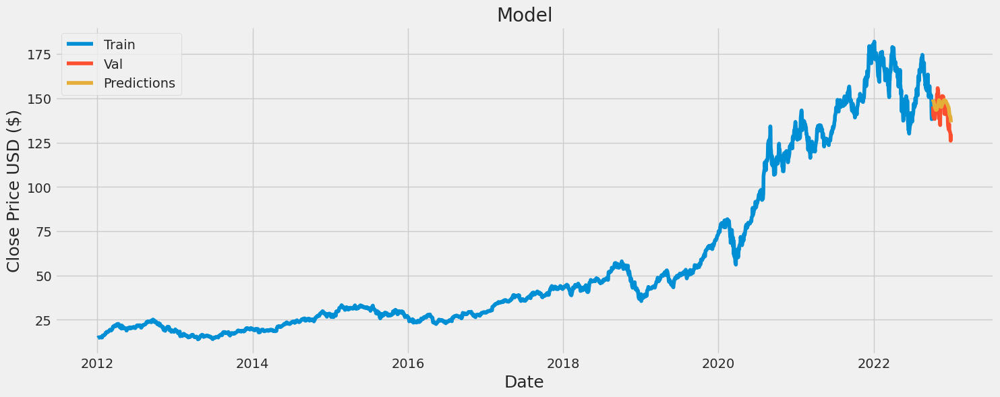

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
n_days = 60

# Plot the data
train = test_dataset.iloc[:-n_days]
valid = pd.DataFrame(test_dataset.iloc[-n_days:])
valid['Predictions'] = predictions.reshape(-1,1)
# print(valid)

# valid['Predictions'] = predictions
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train)
plt.plot(valid)
plt.legend(['Train', 'Val', 'Predictions'], loc='upper left')
plt.show()



###TP

In [ ]:
data =test_dataset.values

y_test = data[-90:]

x_test = (scaler.transform(data[len(data)-90:len(data)].reshape(-1,1)))

x_test = np.array(x_test).reshape(1,-1)
# print(x_test.shape)
# prediction = model.predict(x_test)
# x_test = np.append(x_test, prediction,axis = 1)
# print(x_test.shape)
predictions = []

for i in range(90):
  # print(x_test.shape)
  x_test = x_test[:][-90:]

  prediction = model.predict(x_test)
  x_test = np.append(x_test, prediction,axis = 1)

  predictions.append(scaler.inverse_transform(prediction))
predictions = np.array(predictions).reshape(1,-1)
# print(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

1/1 [==============================] - 0s 91ms/step


13.205178229134535

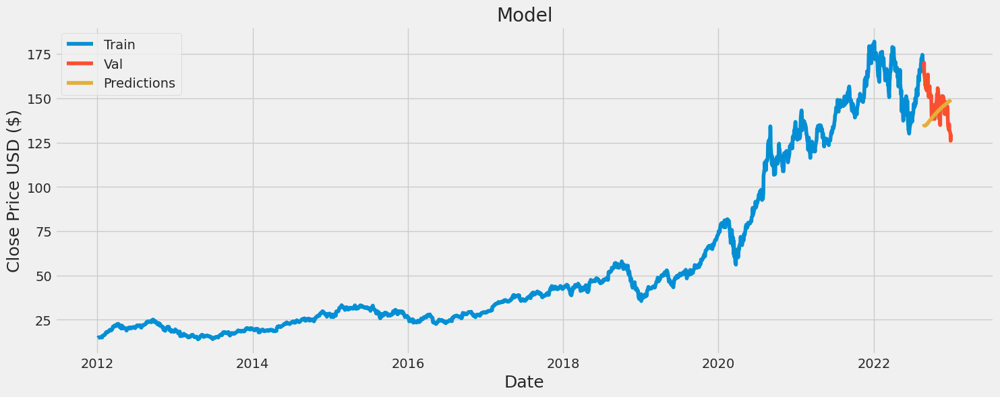

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
n_days = 90

# Plot the data
train = test_dataset.iloc[:-n_days]
valid = pd.DataFrame(test_dataset.iloc[-n_days:])
valid['Predictions'] = predictions.reshape(-1,1)
# print(valid)

# valid['Predictions'] = predictions
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train)
plt.plot(valid)
plt.legend(['Train', 'Val', 'Predictions'], loc='upper left')
plt.show()



In [304]:
model.save_weights('model_bas.h5')

##T2V

In [ ]:
class T2V(Layer):

    def __init__(self, output_dim=None, **kwargs):
      self.output_dim = output_dim
      super(T2V, self).__init__(**kwargs)

    def build(self, input_shape):
      self.W = self.add_weight(name='W',
      shape=(input_shape[-1], self.output_dim),
      initializer='uniform',
      trainable=True)
      self.P = self.add_weight(name='P',
      shape=(input_shape[1], self.output_dim),
      initializer='uniform',
      trainable=True)
      self.w = self.add_weight(name='w',
      shape=(input_shape[1], 1),
      initializer='uniform',
      trainable=True)
      self.p = self.add_weight(name='p',
      shape=(input_shape[1], 1),
      initializer='uniform',
      trainable=True)
      super(T2V, self).build(input_shape)

    def call(self, x):

      original = self.w * x + self.p
      sin_trans = K.sin(K.dot(x, self.W) + self.P)

      return K.concatenate([sin_trans, original], -1)

In [ ]:
model = Sequential()
model.add(Input(shape=(x_train.shape[1], 1)))
model.add(T2V(128))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error')

In [ ]:
model.fit(x_train, y_train, epochs=1)
# model.fit(x_train, y_train, batch_size=1024, epochs = 1)

86/86 [==============================] - 9s 65ms/step - loss: 0.0097


###IMP

In [253]:
data =test_dataset.values

x_test = []
y_test = data[-60:]

for i in range(len(data)-60, len(data)):
    x_test.append(scaler.transform(data[i-60:i].reshape(-1,1)))

# # Convert the data to a numpy array
x_test = np.array(x_test).reshape(60,60)
print(x_test.shape)
# # Reshape the data
# x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))


# Get the models predicted price values
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)
# print(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

(60, 60)
2/2 [==============================] - 1s 50ms/step


8.189641103962785

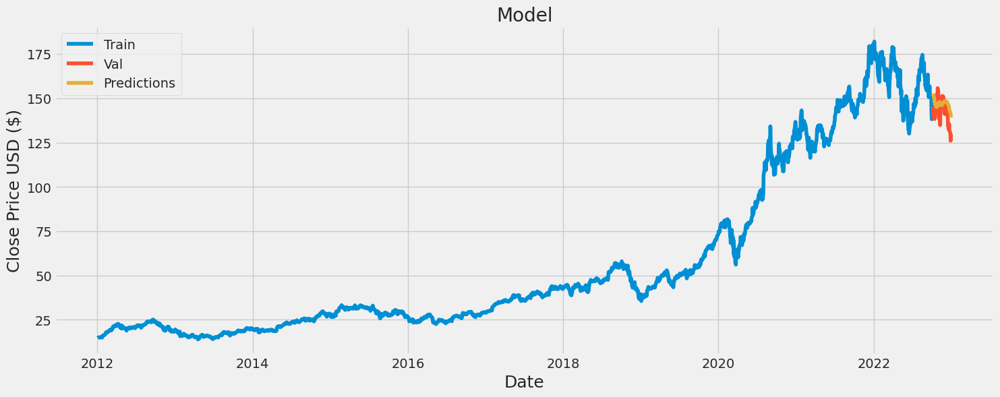

In [254]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline

# Plot the data
train = test_dataset.iloc[:-60]
valid = pd.DataFrame(test_dataset.iloc[-60:])
valid['Predictions'] = predictions
# print(valid)

# valid['Predictions'] = predictions
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train)
plt.plot(valid)
plt.legend(['Train', 'Val', 'Predictions'], loc='upper left')
plt.show()



###TP

In [255]:
data =test_dataset.values

y_test = data[-90:]

x_test = (scaler.transform(data[len(data)-90:len(data)].reshape(-1,1)))

x_test = np.array(x_test).reshape(1,-1)
# print(x_test.shape)
# prediction = model.predict(x_test)
# x_test = np.append(x_test, prediction,axis = 1)
# print(x_test.shape)
predictions = []

for i in range(90):
  # print(x_test.shape)
  x_test = x_test[:][-90:]

  prediction = model.predict(x_test)
  x_test = np.append(x_test, prediction,axis = 1)

  predictions.append(scaler.inverse_transform(prediction))
predictions = np.array(predictions).reshape(1,-1)
# print(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

1/1 [==============================] - 0s 56ms/step


12.47529396867936

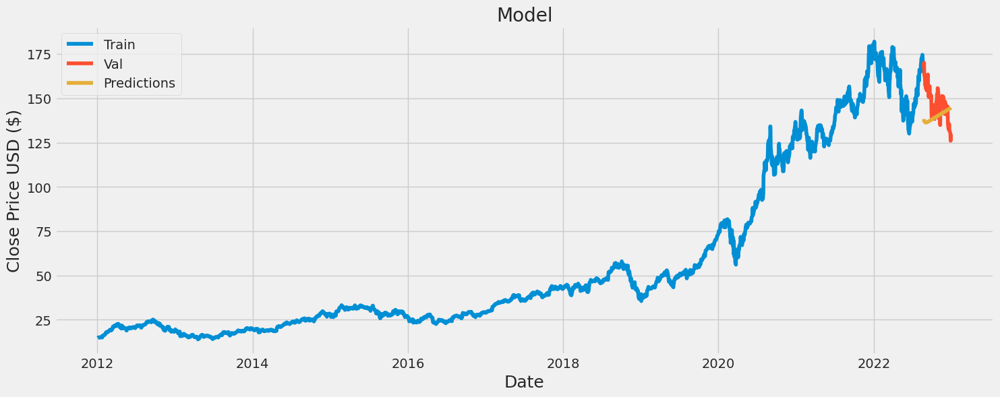

In [256]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
n_days = 90

# Plot the data
train = test_dataset.iloc[:-n_days]
valid = pd.DataFrame(test_dataset.iloc[-n_days:])
valid['Predictions'] = predictions.reshape(-1,1)
# print(valid)

# valid['Predictions'] = predictions
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train)
plt.plot(valid)
plt.legend(['Train', 'Val', 'Predictions'], loc='upper left')
plt.show()



In [301]:
model.save_weights('model_t2v.h5')

# LSTM with embeddings

##first part

In [ ]:
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential, Model
from keras.layers import Embedding, Lambda, Dense
import keras.backend as K

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/uni2/AI/Project/stock prices.csv")

In [ ]:
get_one_stock("AAPL")

,symbol,open,high,low,close,volume
date,,,,,,
2014-01-02,AAPL,79.3828,79.5756,78.8601,79.0185,58791957
2014-01-03,AAPL,78.9799,79.0999,77.2042,77.2828,98303870
2014-01-06,AAPL,76.7785,78.1142,76.2285,77.7042,103359151
2014-01-07,AAPL,77.7599,77.9942,76.8464,77.1481,79432766
2014-01-08,AAPL,76.9728,77.9371,76.9556,77.6371,64686685
...,...,...,...,...,...,...
2017-12-22,AAPL,174.6800,175.4240,174.5000,175.0100,16349444
2017-12-26,AAPL,170.8000,171.4700,169.6790,170.5700,33185536
2017-12-27,AAPL,170.1000,170.7800,169.7100,170.6000,21498213


In [ ]:
x_train, y_train = get_dataset(df,"AAPL")

In [ ]:
def get_dataset_for_embeddings(df,name,cox_size=3):
  name_stock=df.groupby('symbol').get_group(name)
  name_stock.set_index(df.columns[1], inplace=True)
  name_stock_close = name_stock.filter(['close']).values
  name_stock_vol = name_stock.filter(['volume']).values
  # name_stock = scaler.fit_transform(name_stock)

  # dataset_train = pd.DataFrame()
  # dataset_test = pd.DataFrame()

  cl_target = []
  cl_cox = []
  vol_target =[]
  vol_cox = []

  for i in range(cox_size, len(name_stock)-cox_size):
    # print(np.concatenate((name_stock_close[i-cox_size:i],name_stock_close[i+1:i+cox_size+1])).reshape(-1))


    cl_cox.append(np.concatenate((name_stock_close[i-cox_size:i],name_stock_close[i+1:i+cox_size+1])).reshape(-1))
    cl_target.append(name_stock_close[i])

    # cl_cox.append(np.concatenate((name_stock_close[i-cox_size:i],name_stock_close[i+1:i+cox_size+1])).reshape(-1))
    # cl_target.append(name_stock_close[i])
    # print(cl_cox[0])
    # print(cl_target)
    # break


  cl_target, cl_cox = np.array(cl_target), np.array(cl_cox)


  return cl_cox,cl_target

In [ ]:
# cox_size = 3
# x_A,y_A = get_dataset_for_embeddings(df,"AAPL",cox_size)

In [ ]:
x_A = None
y_A = None
cox_size = 3

for i in df.symbol.unique():
  x_tmp, y_tmp = get_dataset_for_embeddings(df,i,cox_size)

  if x_A is None:
      x_A = x_tmp
      y_A = y_tmp
  else:
      # Adjust axis according to the shape of your arrays
      x_A = np.concatenate([x_A, x_tmp], axis=0)
      y_A = np.concatenate([y_A, y_tmp], axis=0)


In [ ]:
from sklearn.preprocessing import OneHotEncoder

# # Example array
# categories = np.array(['dog', 'cat', 'fish', 'cat', 'dog'])

# # Reshape the array to (-1, 1) because it's a single feature
# categories = categories.reshape(-1, 1)
# print(categories)

# # Create the encoder
encoder = OneHotEncoder(sparse=False)
# one_hot_encoded = encoder.fit_transform(categories)
# print(one_hot_encoded)

# category_index = np.argmax([0,1,0])
# category = encoder.categories_[0][category_index]
# category

In [ ]:
x_A.shape

(494442, 6)

In [ ]:
y_A.shape

(494442, 1)

In [ ]:
len(np.unique(x_A))

45342

In [ ]:
y_A

array([[26.905],
       [27.63 ],
       [29.42 ],
       ...,
       [84.98 ],
       [84.79 ],
       [84.88 ]])

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
x_A = scaler.fit_transform(x_A)
y_A = scaler.fit_transform(y_A)

In [ ]:
np.unique(x_A)[:10]

array([0.00000000e+00, 1.46526587e-05, 3.41895370e-05, 3.90737566e-05,
       5.37264153e-05, 5.86106349e-05, 6.34948545e-05, 6.83790740e-05,
       7.32632936e-05, 7.81475132e-05])

In [ ]:
def extra_get(key,dictionary):
    # Check if the exact key exists
    if key in dictionary:
        return dictionary[key]

    # If the key is not found, find the closest key
    closest_key = min(dictionary.keys(), key=lambda k: abs(k - key))
    return dictionary.get(closest_key)

In [ ]:
dicti = {i:idx for idx,i in enumerate(np.unique(x_A))} #dictionary of all values
# dicti = dicti.reshape(2,len(dicti/2))
extra_get = np.vectorize(extra_get)  #vectorize information to map element-wise

In [ ]:
y_A_enum = extra_get(y_A,dicti)
x_A_enum = extra_get(x_A,dicti)

In [ ]:
# dicti[scaler.transform(77.6371)]

In [ ]:
vocab_size = len(dicti) + 1 #reserve for 0 index

##Learn embed

In [ ]:
def get_embedding(value,embeddings_dict,original_dict):
  return embeddings_dict[extra_get(value,original_dict)]
get_embedding_vectorized = np.vectorize(get_embedding)
# def get_value(embedding,embeddings_dict,original_dict):
#   for i in embeddings_dict:


def find_key_by_value(my_dict, search_value):
    for key, value in my_dict.items():
        if value == search_value:
            return key
    return None

# def find_closest_embedding(new_embedding,embeddings_matrix,dicti):
#     # Calculate Euclidean distances
#     distances = np.linalg.norm(embeddings_matrix - new_embedding, axis=1)

#     # Find the index of the smallest distance
#     closest_index = np.argmin(distances)
#     return find_key_by_value(dicti,closest_index)



def find_closest_embedding(new_embedding,embeddings_matrix,dicti):

    val = -2
    index = 0
    for idx,i in enumerate(embeddings_matrix):
      tmp_val = np.dot(new_embedding,i) / (np.linalg.norm(new_embedding) * np.linalg.norm(i))
      if tmp_val > val:
        val = tmp_val
        index= idx

    return find_key_by_value(dicti,index)


find_closest_embedding_vectorized = np.vectorize(find_closest_embedding)



In [ ]:
vocab_size = len(dicti) + 1 #reserve for 0 index
embed_size = 512

model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embed_size, input_length=cox_size*2))
model.add(Lambda(lambda x: K.mean(x, axis=1), output_shape=(embed_size,)))
model.add(Dense(vocab_size, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam')


NameError: ignored

In [ ]:
# import tensorflow as tf
# if tf.test.gpu_device_name():
#     print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
# else:
#     print("Please install GPU version of TensorFlow")

In [ ]:
model.fit(x_A, y_A, epochs=1)

15452/15452 [==============================] - 241s 16ms/step - loss: 0.0402


In [ ]:
embeddings_close_dict = model.layers[0].get_weights()[0]

In [ ]:
get_embedding(77.331,embeddings_close_dict,dicti)

array([ 4.85728495e-02, -2.98343543e-02, -1.60086751e-02,  1.63506381e-02,
       -3.84732112e-02,  4.99926880e-03,  3.94569710e-03,  4.44013998e-03,
        4.32886817e-02,  4.12651040e-02,  1.41254999e-02,  3.12405340e-02,
       -2.55089756e-02, -2.91776899e-02,  8.03654268e-03, -1.59963258e-02,
       -4.47055474e-02, -1.23951808e-02,  3.43572982e-02, -4.85789441e-02,
       -3.64722386e-02,  1.46532170e-02,  1.53030194e-02, -1.07830390e-02,
        3.17781232e-02,  2.82751061e-02,  3.17368172e-02,  3.10896300e-02,
       -4.49921377e-02,  1.33280791e-02,  3.94146927e-02, -3.53089795e-02,
        3.15899290e-02,  1.79680251e-02,  2.34518312e-02,  3.74024846e-02,
       -3.62183824e-02, -1.15124695e-02, -5.14151901e-03, -3.76815796e-02,
        1.06122606e-02,  2.31819227e-03, -1.64336339e-02, -2.38055717e-02,
       -3.00620440e-02, -1.24833360e-02, -3.05811297e-02,  4.30321582e-02,
       -8.08982924e-03,  1.22868530e-02, -3.13671008e-02, -3.30322534e-02,
        5.96255064e-03,  

In [ ]:
aa = (np.cos(get_embedding(77.331,embeddings_close_dict,dicti)))
aa

array([0.99882054, 0.999555  , 0.99987185, 0.9998663 , 0.99926   ,
       0.9999875 , 0.9999922 , 0.99999017, 0.9990632 , 0.9991487 ,
       0.9999002 , 0.9995121 , 0.9996747 , 0.99957436, 0.9999677 ,
       0.9998721 , 0.99900085, 0.99992317, 0.99940985, 0.9988203 ,
       0.999335  , 0.99989265, 0.99988294, 0.9999419 , 0.9994951 ,
       0.9996003 , 0.9994964 , 0.9995168 , 0.99898803, 0.9999112 ,
       0.99922335, 0.9993767 , 0.9995011 , 0.9998386 , 0.99972504,
       0.9993006 , 0.99934417, 0.9999337 , 0.99998677, 0.9992901 ,
       0.9999437 , 0.9999973 , 0.999865  , 0.99971664, 0.9995482 ,
       0.9999221 , 0.99953246, 0.9990743 , 0.9999673 , 0.99992454,
       0.9995081 , 0.9994545 , 0.99998224, 0.99952334, 0.9998657 ,
       0.99998504, 0.9988566 , 0.99947417, 0.99995   , 0.9989472 ,
       0.99928343, 0.9999847 , 0.9991314 , 0.99979985, 0.99989945,
       0.9995594 , 0.9992908 , 0.99956906, 0.9991142 , 0.9992857 ,
       0.9999941 , 0.999948  , 0.99981606, 0.999105  , 0.99977

In [ ]:
# find_closest_embedding1(embeddings_close_dict,aa,dicti)

In [ ]:
# get_value(get_embedding(77.631,embeddings_close_dict,dicti),embeddings_close_dict,dicti)

In [ ]:
embeddings_close_dict[extra_get(77.631,dicti)]

array([ 4.85728495e-02, -2.98343543e-02, -1.60086751e-02,  1.63506381e-02,
       -3.84732112e-02,  4.99926880e-03,  3.94569710e-03,  4.44013998e-03,
        4.32886817e-02,  4.12651040e-02,  1.41254999e-02,  3.12405340e-02,
       -2.55089756e-02, -2.91776899e-02,  8.03654268e-03, -1.59963258e-02,
       -4.47055474e-02, -1.23951808e-02,  3.43572982e-02, -4.85789441e-02,
       -3.64722386e-02,  1.46532170e-02,  1.53030194e-02, -1.07830390e-02,
        3.17781232e-02,  2.82751061e-02,  3.17368172e-02,  3.10896300e-02,
       -4.49921377e-02,  1.33280791e-02,  3.94146927e-02, -3.53089795e-02,
        3.15899290e-02,  1.79680251e-02,  2.34518312e-02,  3.74024846e-02,
       -3.62183824e-02, -1.15124695e-02, -5.14151901e-03, -3.76815796e-02,
        1.06122606e-02,  2.31819227e-03, -1.64336339e-02, -2.38055717e-02,
       -3.00620440e-02, -1.24833360e-02, -3.05811297e-02,  4.30321582e-02,
       -8.08982924e-03,  1.22868530e-02, -3.13671008e-02, -3.30322534e-02,
        5.96255064e-03,  

In [ ]:
x_train[0][0:6]

array([[0.07256629],
       [0.05603937],
       [0.06005184],
       [0.05475679],
       [0.05941293],
       [0.04997115]])

In [ ]:
# for i in x_train_embedded:
#   for j in i:
#     print(find_closest_embedding1(j,embeddings_close_dict,dicti))
#   break

In [ ]:
# find_closest_embedding(x_train_embedded,embeddings_close_dict)

### Convert train to embed

In [ ]:
x_train.shape,y_train.shape

((2727, 60), (2727, 1))

In [ ]:
x_train_embedded = []
for i in tqdm(x_train):
  x_train_embedded.append(get_embedding(i,embeddings_close_dict,dicti))
x_train_embedded = np.array(x_train_embedded)

  0%|          | 0/2727 [00:00<?, ?it/s]

In [ ]:
y_train_embedded = []
for i in tqdm(y_train):
  y_train_embedded.append(get_embedding(i,embeddings_close_dict,dicti))
y_train_embedded = np.array(y_train_embedded)

  0%|          | 0/2727 [00:00<?, ?it/s]

In [ ]:
x_train_embedded = x_train_embedded.reshape(2727,60,embed_size)
y_train_embedded = y_train_embedded.reshape(2727,embed_size)

In [ ]:
dicti_oh = {}
max_id = max(dicti.values())

# Create a new dictionary with one-hot encoding
for key, value in tqdm(dicti.items()):
    one_hot_vector = [0] * (max_id + 1)
    one_hot_vector[value] = 1
    dicti_oh[key] = one_hot_vector

print(dicti_oh)

  0%|          | 0/45342 [00:00<?, ?it/s]

In [ ]:
dicti_oh

### Load data and Sanity check

In [ ]:
x_train,y_train = load_data("AAPL")

[*********************100%%**********************]  1 of 1 completed


In [ ]:
import pickle

x_train_embedded = np.load('/content/drive/MyDrive/Colab Notebooks/uni2/AI/Project/x_train_embedded.npy')
y_train_embedded = np.load('/content/drive/MyDrive/Colab Notebooks/uni2/AI/Project/y_train_embedded.npy')
embeddings_close_dict = np.load('/content/drive/MyDrive/Colab Notebooks/uni2/AI/Project/embeddings_close_dict.npy')
with open('/content/drive/MyDrive/Colab Notebooks/uni2/AI/Project/dicti.pkl', 'rb') as pickle_file:
    dicti = pickle.load(pickle_file)

### **Embeddings is working!**

In [ ]:
scaler.inverse_transform([x_train[0]])

array([[14.6867857 , 14.76571369, 14.92964268, 15.08571434, 15.0617857 ,
        15.11571407, 15.09107113, 15.04964256, 14.99321365, 15.16785717,
        15.32535744, 15.27678585, 15.01071358, 15.26464272, 15.01464272,
        15.95214272, 15.87964344, 15.97428608, 16.17892838, 16.30285645,
        16.29249954, 16.25428581, 16.41714287, 16.57035637, 16.74392891,
        17.02428627, 17.61321449, 17.62214279, 17.95000076, 18.19499969,
        17.7739296 , 17.9360714 , 17.93285751, 18.38750076, 18.3228569 ,
        18.44249916, 18.65749931, 18.77714348, 19.12178612, 19.37285614,
        19.44535637, 19.47071457, 19.04142952, 18.93785667, 18.95321465,
        19.35678673, 19.47035789, 19.7142868 , 20.28928566, 21.05642891,
        20.91285706, 20.91321373, 21.46785736, 21.6414299 , 21.5178566 ,
        21.40500069, 21.28750038, 21.67785645, 21.94571495, 22.05785751]])

In [ ]:
x_train_embedded1 = []
for i in tqdm(x_train[-1]):
  x_train_embedded1.append(get_embedding(i,embeddings_close_dict,dicti))
x_train_embedded1 = np.array(x_train_embedded1)
print(x_train_embedded1.shape)



  0%|          | 0/60 [00:00<?, ?it/s]

(60, 512)


In [ ]:
x_train_embedded[0][0].shape

(512,)

In [ ]:
ans = []
for i in tqdm(x_train_embedded[0]):
  ans.append(find_closest_embedding(i,embeddings_close_dict,dicti))
ans = np.array(ans)
ans

  0%|          | 0/60 [00:00<?, ?it/s]

array([0.00168506, 0.        , 0.00823235, 0.01066714, 0.01291388,
       0.01291388, 0.01646715, 0.01908753, 0.01759052, 0.01590546,
       0.01890193, 0.02301688, 0.02507558, 0.02301688, 0.02582355,
       0.04659545, 0.05276911, 0.05894276, 0.0653069 , 0.06380744,
       0.07241832, 0.07653572, 0.08626509, 0.07709741, 0.07877758,
       0.07615964, 0.07354169, 0.07148055, 0.07765909, 0.07428898,
       0.07223101, 0.07615964, 0.07241832, 0.05351639, 0.04996068,
       0.04173077, 0.0366756 , 0.03686609, 0.04453431, 0.04453431,
       0.04453431, 0.04865171, 0.0366756 , 0.03461935, 0.03517859,
       0.03611636, 0.03742289, 0.03480495, 0.03611636, 0.03854626,
       0.04771883, 0.03966963, 0.04041692, 0.04958948, 0.04865171,
       0.04303974, 0.04715714, 0.05052237, 0.04734274, 0.05164574])

In [ ]:
scaler.inverse_transform([ans])

array([[14.2306949 , 13.94750023, 15.33104986, 15.74024564, 16.11783853,
        16.11783853, 16.71500991, 17.15539815, 16.90380636, 16.62061168,
        17.12420569, 17.81577529, 18.1617653 , 17.81577529, 18.2874709 ,
        21.77844858, 22.81600819, 23.8535678 , 24.92314073, 24.67113851,
        26.11830433, 26.81028436, 28.44542577, 26.90468258, 27.1870564 ,
        26.74707859, 26.30710078, 25.96070034, 26.99908081, 26.43269146,
        26.08682458, 26.74707859, 26.11830433, 22.94159887, 22.34401707,
        20.96087787, 20.11129385, 20.14330716, 21.43204813, 21.43204813,
        21.43204813, 22.12402816, 20.11129385, 19.76571426, 19.85970206,
        20.01730605, 20.23688453, 19.79690672, 20.01730605, 20.42568098,
        21.96724502, 20.61447743, 20.74006811, 22.28163215, 22.12402816,
        21.18086677, 21.8728468 , 22.43841529, 21.90403926, 22.62721174]])

In [ ]:
scaler.inverse_transform([[find_closest_embedding(x_train_embedded[-1][-1],embeddings_close_dict,dicti)]])

array([[49.79830411]])

In [ ]:
x_train_embedded.shape,y_train_embedded.shape

((2727, 60, 512), (2727, 512))

In [ ]:
x_A[0]

array([0.01160979, 0.01218613, 0.01242545, 0.01271851, 0.01359278,
       0.01355859])

In [ ]:
scaler.inverse_transform(scaler.transform([[77]]))

array([[77.]])

In [ ]:
scaler.inverse_transform([[find_closest_embedding((x_train_embedded[0][0]),embeddings_close_dict,dicti)]])

array([[14.2306949]])

In [ ]:
get_embedding(79.0185,embeddings_close_dict,dicti).shape

(512,)

In [ ]:
get_embedding(x_A[0],embeddings_close_dict,dicti).shape

(6, 512)

In [ ]:
np.save('x_train_embedded.npy', x_train_embedded)
np.save('y_train_embedded.npy', y_train_embedded)

In [ ]:
dicti

{0.0: 0,
 1.4652658724925607e-05: 1,
 3.418953702482642e-05: 2,
 3.907375659980162e-05: 3,
 5.3726415324727226e-05: 4,
 5.861063489970243e-05: 5,
 6.349485447467763e-05: 6,
 6.837907404965283e-05: 7,
 7.326329362462814e-05: 8,
 7.814751319960335e-05: 9,
 8.303173277457855e-05: 10,
 8.791595234955375e-05: 11,
 9.280017192452895e-05: 12,
 9.768439149950416e-05: 13,
 0.00010256861107447936: 14,
 0.00010745283064945467: 15,
 0.00011233705022442987: 16,
 0.00011722126979940507: 17,
 0.00012210548937438028: 18,
 0.00012698970894935548: 19,
 0.00013187392852433068: 20,
 0.00013675814809930588: 21,
 0.00014164236767428098: 22,
 0.0001465265872492563: 23,
 0.0001514108068242315: 24,
 0.0001562950263992067: 25,
 0.0001611792459741819: 26,
 0.0001660634655491571: 27,
 0.0001709476851241323: 28,
 0.0001758319046991075: 29,
 0.0001807161242740827: 30,
 0.00018560034384905802: 31,
 0.00019048456342403322: 32,
 0.00019536878299900842: 33,
 0.00020025300257398362: 34,
 0.00020513722214895872: 35,
 0.0

In [ ]:
np.save('embeddings_close_dict.npy',embeddings_close_dict)


In [ ]:
import pickle


# Write to a file using pickle
with open('dicti.pkl', 'wb') as pickle_file:
    pickle.dump(dicti, pickle_file)


In [ ]:
x_train_embedded[0]

array([[ 0.00633842,  0.00336393,  0.01676563, ..., -0.00633568,
        -0.01123556,  0.01189905],
       [ 0.19768912,  0.1944847 ,  0.20017043, ..., -0.17923671,
        -0.17547612,  0.18985927],
       [ 0.01309588, -0.02653831, -0.01978799, ...,  0.04128101,
         0.04264209,  0.02011471],
       ...,
       [ 0.01017029, -0.00522937, -0.03384044, ...,  0.04312134,
         0.0146412 , -0.00031214],
       [-0.01738318, -0.02021304,  0.01800836, ...,  0.0232879 ,
        -0.03617488,  0.04284963],
       [-0.02465945,  0.00858312, -0.02077359, ..., -0.02199742,
         0.03098211, -0.01824938]], dtype=float32)

##LSTM

In [ ]:
y_train

array([[0.04660893],
       [0.044418  ],
       [0.04847262],
       ...,
       [0.7735962 ],
       [0.78531794],
       [0.767884  ]])

In [ ]:
scaler.inverse_transform(np.array([i for i in dicti.keys()]).reshape(-1,1))

array([[ 13.94750023],
       [ 13.94996279],
       [ 13.95324621],
       ...,
       [180.71386584],
       [181.48793128],
       [182.00999451]])

In [ ]:
x_train_embedded
y_train_embedded

array([[-0.02705655, -0.03309665,  0.00557506, ...,  0.04028854,
        -0.0454342 , -0.02603934],
       [ 0.01380508, -0.04569647,  0.01565316, ..., -0.03520496,
         0.00011839, -0.03450769],
       [ 0.0129871 , -0.04964931,  0.01283569, ...,  0.03523031,
         0.03342426, -0.00169188],
       ...,
       [ 0.01474989,  0.03195597,  0.02112385, ..., -0.00502275,
        -0.04625893,  0.04535452],
       [-0.03332197, -0.0176493 , -0.00045617, ..., -0.0268352 ,
        -0.04461093, -0.02799126],
       [-0.02385577,  0.02949948, -0.02442185, ..., -0.03736203,
        -0.0481454 , -0.0027358 ]], dtype=float32)

In [ ]:
vocab_size

45343

In [ ]:
extra_get(scaler.transform([[100]])[0][0],dicti)

array(44296)

In [ ]:
y_train_cat = to_categorical([extra_get(i[0],dicti) for i in tqdm(y_train)], num_classes=vocab_size)

  0%|          | 0/2727 [00:00<?, ?it/s]

In [ ]:
x_train_embedded[:10].shape

(10, 60, 512)

In [ ]:
y_train.shape

(2727, 1)

In [ ]:
train_size = int(np.ceil(len(x_train_embedded) * 0.95))
x_train_emb, x_val_emb, y_train_cat, y_val_cat = x_train_embedded[:train_size], x_train_embedded[train_size:], y_train_cat[:train_size], y_train_cat[train_size:]
x_train_r, x_val_r, y_train_r, y_val_r = x_train[:train_size], x_train[train_size:], y_train[:train_size], y_train[train_size:]

In [ ]:
np.save('x_train.npy', x_train)
np.save('x_val_r.npy', x_val_r)
np.save('y_train.npy', y_train)
np.save('y_val_cat.npy', y_val_cat)

In [ ]:
x_train.shape,y_train.shape

((2727, 60), (2727, 1))

In [ ]:
x_val_emb.shape,y_val_cat.shape

((136, 60, 512), (136, 45343))

## Model 1

In [ ]:
# from keras.models import Sequential
# from keras.layers import Embedding, LSTM
# import numpy as np

# model = Sequential()
# embedding_layer = Embedding(input_dim=vocab_size, output_dim=embed_size, input_length=cox_size*2)
# model.add(embedding_layer)
# model.add(Lambda(lambda x: K.mean(x, axis=1), output_shape=(embed_size,)))
# model.add(Dense(vocab_size, activation='softmax'))
# model = Sequential()
# model.add(LSTM(128, return_sequences=True, input_shape= (x_train_embedded.shape[1], 1)))
# model.add(LSTM(64, return_sequences=False))
# model.add(Dense(25))
# model.add(Dense(1))

# # Set the weights of the Embedding layer
# embedding_layer.set_weights([embeddings_close_dict])

# # Compile the model
# model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])



In [ ]:
pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.3/612.3 kB 7.4 MB/s eta 0:00:00


In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, TimeDistributed
from tensorflow.keras.losses import categorical_crossentropy, cosine_similarity
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay
# import tensorflow_addons as tfa

vocab_size = len(dicti) + 1
model = Sequential()
model.add(LSTM(32, return_sequences=False, input_shape= (x_train_embedded.shape[1], x_train_embedded.shape[2])))
# model.add(LSTM(256, return_sequences=True))
# model.add(LSTM(512, return_sequences=False))
model.add(Dense(vocab_size, activation='softmax'))
# model.add(Dense(256))
# model.add(Dense(x_train_embedded.shape[2]))



lr_schedule = ExponentialDecay(
    0.00000001,
    decay_steps=1000,
    decay_rate=0.9,
    staircase=False)
optimizer = Adam(learning_rate=lr_schedule)#default 0.00000001
model.compile(optimizer='adam', loss=categorical_crossentropy)#, metrics=['accuracy'])


# Train the model




In [ ]:
history = model.fit(x_train, y_train, epochs=1, validation_data=(x_val, y_val))

81/81 [==============================] - 3s 18ms/step - loss: 10.6863 - val_loss: 9.6653


In [ ]:
# history.history

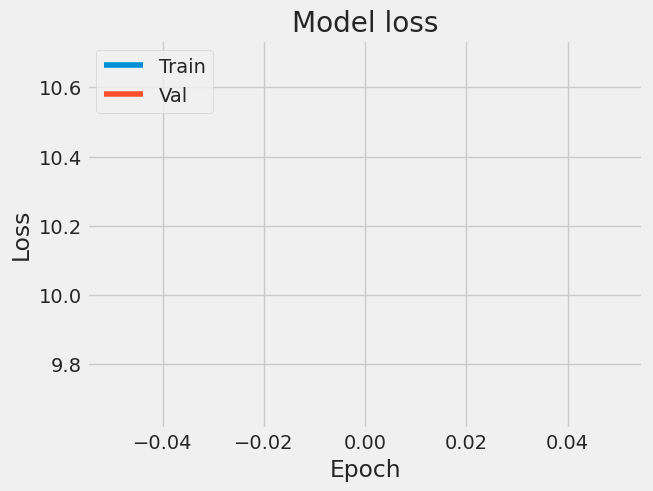

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# # Plot training & validation loss values
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.title('Model loss')
# plt.ylabel('Loss')
# plt.xlabel('Epoch')
# plt.legend(['Train', 'Val'], loc='upper left')
# plt.show()


In [ ]:
# Create the testing data set
# Create a new array containing scaled values from index 1543 to 2002
# test_data = scaled_data[training_data_len - 60: , :]
# Create the data sets x_test and y_test

test = (get_one_stock("AAL"))
test = test.filter(['close'])

x_test = []
y_test = test.values[-60:]
for i in range(len(test) - 60, len(test)):
    x_test.append(test.values[i-60:i])

x_test = np.array([scaler.transform(i) for i in x_test]).reshape(-1,60)

x_test_embedded = []
for i in tqdm(x_test):
  x_tmp = []
  for j in i:
    x_tmp.append(get_embedding(i[0],embeddings_close_dict,dicti))
  x_test_embedded.append(x_tmp)
x_test_embedded = np.array(x_test_embedded)
print(x_test_embedded.shape)

# x_test_embedded = np.reshape(x_test_embedded, (x_test_embedded.shape[0], x_test_embedded.shape[1], x_test_embedded.shape[3] ))
# print(x_test_embedded.shape)

# Reshape the data
# x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

# Get the models predicted price values




  0%|          | 0/60 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
predictions_raw = model.predict(x_test_embedded)
predictions_raw

2/2 [==============================] - 0s 9ms/step


array([[8.1928018e-05, 5.3214994e-06, 5.4492407e-06, ..., 5.2695909e-06,
        3.5521350e-04, 5.4951333e-06],
       [8.1928018e-05, 5.3214994e-06, 5.4492407e-06, ..., 5.2695909e-06,
        3.5521350e-04, 5.4951333e-06],
       [8.1946899e-05, 5.3173799e-06, 5.4457601e-06, ..., 5.2654068e-06,
        3.5530771e-04, 5.4918492e-06],
       ...,
       [8.1852151e-05, 5.3023882e-06, 5.4298239e-06, ..., 5.2509445e-06,
        3.5553955e-04, 5.4765560e-06],
       [8.1904647e-05, 5.3124968e-06, 5.4403522e-06, ..., 5.2607593e-06,
        3.5537774e-04, 5.4866459e-06],
       [8.1909544e-05, 5.3136055e-06, 5.4412772e-06, ..., 5.2614178e-06,
        3.5533498e-04, 5.4873590e-06]], dtype=float32)

In [ ]:
predictions = np.array([scaler.inverse_transform([[find_key_by_value(dicti,j)]]) for j in [np.argmax(i) for i in predictions_raw]]).reshape(-1,1)
predictions

array([[146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146.12471475],
       [146

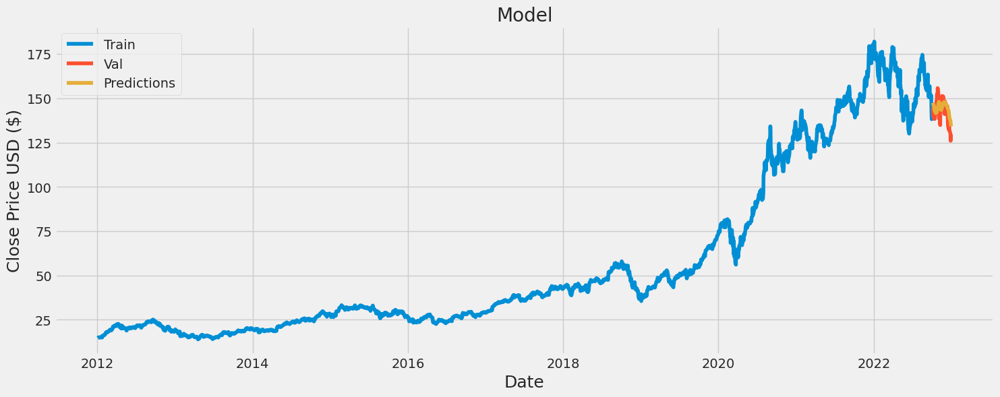

In [275]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
n_days = 60

# Plot the data
train = test_dataset.iloc[:-n_days]
valid = pd.DataFrame(test_dataset.iloc[-n_days:])
valid['Predictions'] = predictions.reshape(-1,1)
# print(valid)

# valid['Predictions'] = predictions
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train)
plt.plot(valid)
plt.legend(['Train', 'Val', 'Predictions'], loc='upper left')
plt.show()



### TP

In [ ]:
test_dataset = pdr.get_data_yahoo("AAPL", start=startdate, end=enddate).Close

[*********************100%%**********************]  1 of 1 completed


In [ ]:
test_dataset = test_dataset[:2100]
test_dataset

Date
2012-01-03    14.686786
2012-01-04    14.765714
2012-01-05    14.929643
2012-01-06    15.085714
2012-01-09    15.061786
                ...    
2020-05-01    72.267502
2020-05-04    73.290001
2020-05-05    74.389999
2020-05-06    75.157501
2020-05-07    75.934998
Name: Close, Length: 2100, dtype: float64

In [ ]:
data =test_dataset.values

print(data)
y_test = data[-60:]

x_test = (scaler.transform(data[len(data)-60:len(data)].reshape(-1,1)))

x_test = np.array(x_test).reshape(1,-1)

x_test_embedded = []
for i in tqdm(x_test):
  x_tmp = []
  for j in i:
    x_tmp.append(get_embedding(i[0],embeddings_close_dict,dicti))
  x_test_embedded.append(x_tmp)
x_test_embedded = np.array(x_test_embedded)
print(x_test_embedded.shape)



#   x_test = np.append(x_test, prediction,axis = 1)

#   predictions.append(scaler.inverse_transform(prediction))
# predictions = np.array(predictions).reshape(1,-1)
# # print(predictions)

# # Get the root mean squared error (RMSE)
# rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
# rmse

[14.6867857  14.76571369 14.92964268 ... 74.38999939 75.15750122
 75.93499756]


  0%|          | 0/1 [00:00<?, ?it/s]

(1, 60, 512)


In [ ]:
predictions = []
# for i in range(60):
  # print(x_test.shape)
x_test_embedded = x_test_embedded[:, -60:, :]

predictions = []

for i in range(60):
  x_test_embedded = x_test_embedded[:, -60:, :]
  prediction = model.predict(x_test_embedded)
  print(x_test_embedded.shape)
  tmp = find_key_by_value(dicti,np.argmax(prediction))
  pred_embd = get_embedding(tmp,embeddings_close_dict,dicti).reshape(1,1,-1)
  x_test_embedded = np.concatenate([x_test_embedded, pred_embd], axis=1)

  real_value_prediction = scaler.inverse_transform([[tmp]])
  predictions.append(real_value_prediction)

predictions = np.array(predictions)

1/1 [==============================] - 1s 500ms/step
(1, 60, 512)
1/1 [==============================] - 0s 35ms/step
(1, 60, 512)
1/1 [==============================] - 0s 30ms/step
(1, 60, 512)
1/1 [==============================] - 0s 33ms/step
(1, 60, 512)
1/1 [==============================] - 0s 33ms/step
(1, 60, 512)
1/1 [==============================] - 0s 37ms/step
(1, 60, 512)
1/1 [==============================] - 0s 37ms/step
(1, 60, 512)
1/1 [==============================] - 0s 33ms/step
(1, 60, 512)
1/1 [==============================] - 0s 30ms/step
(1, 60, 512)
1/1 [==============================] - 0s 31ms/step
(1, 60, 512)
1/1 [==============================] - 0s 29ms/step
(1, 60, 512)
1/1 [==============================] - 0s 27ms/step
(1, 60, 512)
1/1 [==============================] - 0s 26ms/step
(1, 60, 512)
1/1 [==============================] - 0s 28ms/step
(1, 60, 512)
1/1 [==============================] - 0s 28ms/step
(1, 60, 512)
1/1 [===================

In [ ]:
predictions.reshape(1,-1),y_test

(array([[150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388,
         150.16988388, 150.16988388, 150.16988388, 150.16988388]]),
 array([81.80000305, 8

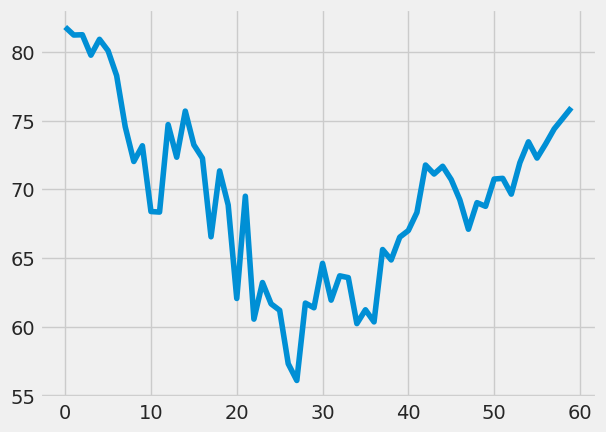

In [ ]:
plt.plot(y_test)

ValueError: ignored

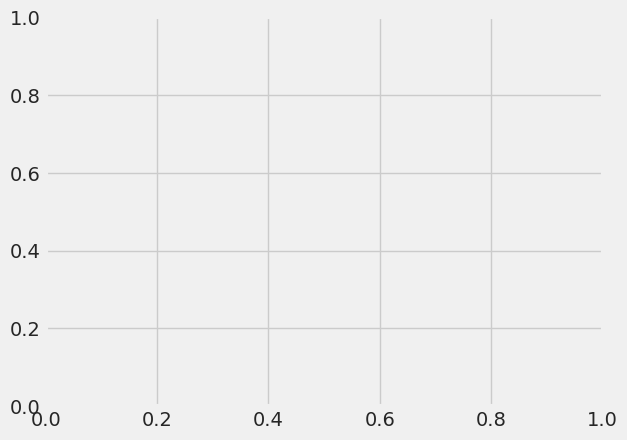

In [ ]:
plt.plot(predictions)

In [ ]:
# print(predictions.shape)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline

# Plot the data
train = test[:-60]
valid = pd.DataFrame(test[-60:])
valid['Predictions'] = predictions
# Visualize the data
print(valid)
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train)
plt.plot(valid[['close', 'Predictions']])
plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
plt.show()



## Model with concatenation

In [ ]:
# from keras.models import Sequential
# from keras.layers import Embedding, LSTM
# import numpy as np

# model = Sequential()
# embedding_layer = Embedding(input_dim=vocab_size, output_dim=embed_size, input_length=cox_size*2)
# model.add(embedding_layer)
# model.add(Lambda(lambda x: K.mean(x, axis=1), output_shape=(embed_size,)))
# model.add(Dense(vocab_size, activation='softmax'))
# model = Sequential()
# model.add(LSTM(128, return_sequences=True, input_shape= (x_train_embedded.shape[1], 1)))
# model.add(LSTM(64, return_sequences=False))
# model.add(Dense(25))
# model.add(Dense(1))

# # Set the weights of the Embedding layer
# embedding_layer.set_weights([embeddings_close_dict])

# # Compile the model
# model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])



In [ ]:
x_train_r = x_train_r.reshape(x_train_r.shape[0],x_train_r.shape[1],1)
x_val_r = x_val_r.reshape(x_val_r.shape[0],x_val_r.shape[1],1)

In [ ]:
x_train_r.shape,x_train_emb.shape, y_train_r.shape

((2591, 60, 1), (2591, 60, 512), (2591, 1))

In [ ]:
x_val_r.shape, y_val_r.shape

((136, 60, 1), (136, 1))

In [ ]:
x_val_emb.shape

(136, 60, 512)

In [ ]:
x_tmp = np.concatenate([x_train_r,x_train_emb], axis =2)
x_tmp_v = np.concatenate([x_val_r,x_val_emb], axis =2)
x_tmp.shape

(2591, 60, 513)

In [ ]:
from keras.models import Sequential
from keras.layers import Input, Embedding, LSTM, Dense, Concatenate, Softmax
from tensorflow.keras.losses import categorical_crossentropy, cosine_similarity
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras import Model


vocab_size = 40000

r_input = Input(shape=(x_tmp.shape[1],x_tmp.shape[2]))
# embd_input = Input(shape=(x_train_emb.shape[2],x_train_emb.shape[1]), name='embedding')
# concatenated = Concatenate()([r_input, embd_input])

lstm_layer = LSTM(256, return_sequences=False)(r_input)
dense_layer = Dense(256, activation='relu')(lstm_layer)


output_layer = Dense(1, activation='linear')(dense_layer)

model = Model(inputs=r_input, outputs=output_layer)
model.compile(optimizer='adam', loss='mean_squared_error')

model.summary()

# vocab_size = len(dicti) + 1
# model = Sequential()
# model.add(LSTM(32, return_sequences=False, input_shape= (x_train_embedded.shape[1], x_train_embedded.shape[2])))
# # model.add(LSTM(256, return_sequences=True))
# # model.add(LSTM(512, return_sequences=False))
# model.add(Dense(vocab_size, activation='softmax'))
# # model.add(Dense(256))
# # model.add(Dense(x_train_embedded.shape[2]))



# lr_schedule = ExponentialDecay(
#     0.00000001,
#     decay_steps=1000,
#     decay_rate=0.9,
#     staircase=False)
# optimizer = Adam(learning_rate=lr_schedule)#default 0.00000001
# model.compile(optimizer='adam', loss=categorical_crossentropy)#, metrics=['accuracy'])





Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 60, 513)]         0         
                                                                 
 lstm_11 (LSTM)              (None, 256)               788480    
                                                                 
 dense_18 (Dense)            (None, 256)               65792     
                                                                 
 dense_19 (Dense)            (None, 1)                 257       
                                                                 
Total params: 854529 (3.26 MB)
Trainable params: 854529 (3.26 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
history = model.fit(x_tmp, y_train_r, epochs=1, validation_data=(x_tmp_v, y_val_r))

81/81 [==============================] - 35s 405ms/step - loss: 0.0038 - val_loss: 0.0018


In [ ]:
# history.history

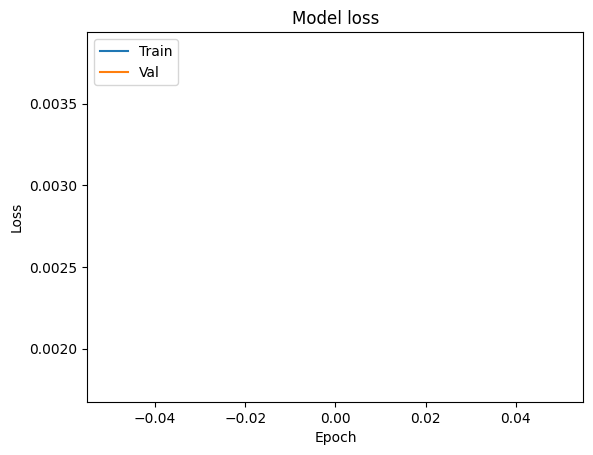

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# # Plot training & validation loss values
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.title('Model loss')
# plt.ylabel('Loss')
# plt.xlabel('Epoch')
# plt.legend(['Train', 'Val'], loc='upper left')
# plt.show()


### TP and IMP

In [ ]:
test_dataset = pdr.get_data_yahoo("AAPL", start=startdate, end=enddate).Close

[*********************100%%**********************]  1 of 1 completed


In [ ]:
data =test_dataset.values

print(data)
y_test = data[-60:]

x_test = (scaler.transform(data[len(data)-60:len(data)].reshape(-1,1)))

x_test = np.array(x_test).reshape(1,-1)

x_test_embedded = []
for i in tqdm(x_test):
  x_tmp = []
  for j in i:
    x_tmp.append(get_embedding(i[0],embeddings_close_dict,dicti))
  x_test_embedded.append(x_tmp)
x_test_embedded = np.array(x_test_embedded)
print(x_test_embedded.shape)



#   x_test = np.append(x_test, prediction,axis = 1)

#   predictions.append(scaler.inverse_transform(prediction))
# predictions = np.array(predictions).reshape(1,-1)
# # print(predictions)

# # Get the root mean squared error (RMSE)
# rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
# rmse

[ 14.6867857   14.76571369  14.92964268 ... 126.04000092 129.61000061
 129.92999268]


  0%|          | 0/1 [00:00<?, ?it/s]

(1, 60, 512)


In [ ]:
x_test_embedded = np.concatenate([x_test.reshape(1,-1,1),x_test_embedded] , axis = 2)
print(x_test_embedded.shape)
ans = model.predict(x_test_embedded)
get_embedding(ans,embeddings_close_dict,dicti)

In [ ]:
predictions = []
# for i in range(60):
  # print(x_test.shape)
x_test_embedded = x_test_embedded[:, -60:, :]

predictions = []

for i in range(60):
  x_test_embedded = x_test_embedded[:, -60:, :]
  prediction = model.predict(x_test_embedded)
  print(x_test_embedded.shape)
  tmp = find_key_by_value(dicti,np.argmax(prediction))
  pred_embd = get_embedding(tmp,embeddings_close_dict,dicti).reshape(1,1,-1)
  x_test_embedded = np.concatenate([x_test_embedded, pred_embd], axis=1)

  real_value_prediction = scaler.inverse_transform([[tmp]])
  predictions.append(real_value_prediction)

predictions = np.array(predictions)

In [ ]:
scaler.inverse_transform(ans)

array([[117.963196]], dtype=float32)

In [276]:
np.mean((redictions.reshape(1,-1) - y_test)**2)

(60, 60)
2/2 [==============================] - 0s 64ms/step


7.6221639240421935

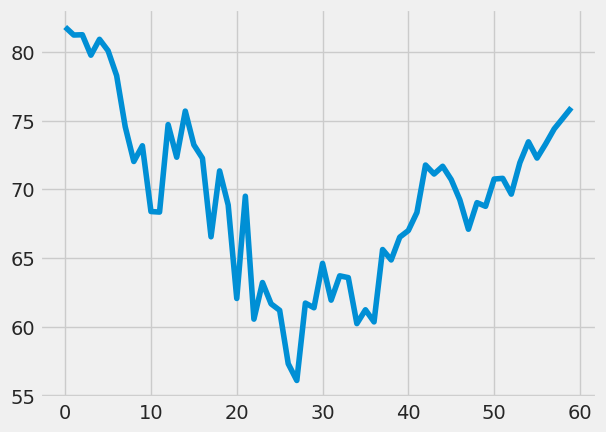

In [ ]:
plt.plot(y_test)

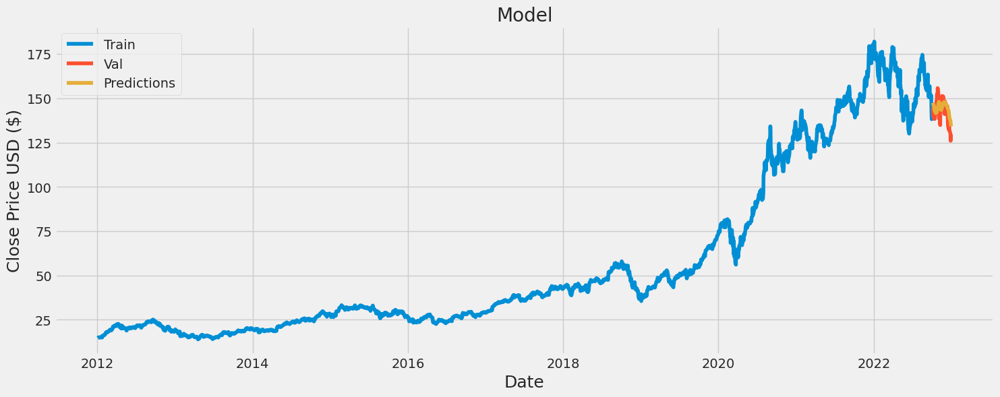

In [281]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline

# Plot the data
train = test[:-60]
valid = pd.DataFrame(test[-60:])
valid['Predictions'] = predictions
# Visualize the data
# print(valid)
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train)
plt.plot(valid[['close', 'Predictions']])
plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
plt.show()



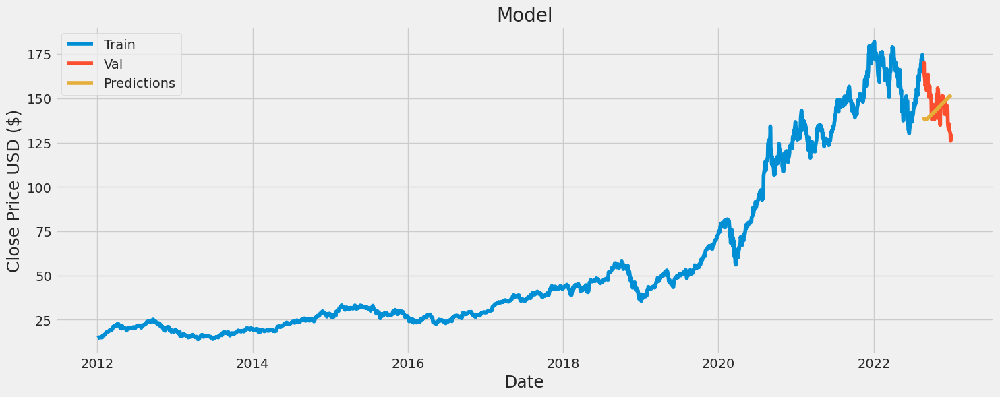

In [295]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
n_days = 90

# Plot the data
train = test_dataset.iloc[:-n_days]
valid = pd.DataFrame(test_dataset.iloc[-n_days:])
valid['Predictions'] = predictions.reshape(-1,1)
# print(valid)

# valid['Predictions'] = predictions
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train)
plt.plot(valid)
plt.legend(['Train', 'Val', 'Predictions'], loc='upper left')
plt.show()



In [ ]:
# print(predictions.shape)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

In [298]:
model.save_weights('model_concat.h5')